<a href="https://colab.research.google.com/github/krishh1703/INSE-6220/blob/main/Classification_and_Principal_Component_Analysis_of_Raisins_40196344.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Principal Component Analysis and Classification of Raisins**

**Install Pycaret**

In [ ]:
!pip install pycaret==2.3.6

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


**Import Libraries**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.3.5
Seaborn version:  0.11.2


**DATASET**

Images of Kecimen and Besni raisin varieties grown in Turkey were obtained with CVS. A total of 900 raisin grains were used, including 450 pieces from both varieties. These images were subjected to various stages of pre-processing and 7 morphological features were extracted. These features have been classified using three different artificial intelligence techniques.


Attribute Information:

1.) Area: Gives the number of pixels within the boundaries of the raisin.

2.) Perimeter: It measures the environment by calculating the distance between the boundaries of the raisin and the pixels around it.

3.) MajorAxisLength: Gives the length of the main axis, which is the longest line that can be drawn on the raisin.

4.) MinorAxisLength: Gives the length of the small axis, which is the shortest line that can be drawn on the raisin.

5.) Eccentricity: It gives a measure of the eccentricity of the ellipse, which has the same moments as raisins.

6.) ConvexArea: Gives the number of pixels of the smallest convex shell of the region formed by the raisin.

7.) Extent: Gives the ratio of the region formed by the raisin to the total pixels in the bounding box.

8.) Class: Kecimen and Besni raisin.

The original Dataset can be found in the link below:https://archive.ics.uci.edu/ml/datasets/Raisin+Dataset#


In [ ]:
#read cvs file into dataframe
df = pd.read_csv('https://raw.githubusercontent.com/krishh1703/INSE-6220/main/Final_Raisin_Dataset.csv')
df.head(25)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter,Class
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040,0
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786,0
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575,0
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162,0
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251,0
5,49242,318.125407,200.122120,0.777351,51368,0.658456,881.836,0
6,42492,310.146072,176.131449,0.823099,43904,0.665894,823.796,0
7,60952,332.455472,235.429835,0.706058,62329,0.743598,933.366,0
8,42256,323.189607,172.575926,0.845499,44743,0.698031,849.728,0
9,64380,366.964842,227.771615,0.784056,66125,0.664376,981.544,0


In [ ]:
len(df.index)

900

In [ ]:
print(df["Class"].unique())

[0 1]


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             900 non-null    int64  
 1   MajorAxisLength  900 non-null    float64
 2   MinorAxisLength  900 non-null    float64
 3   Eccentricity     900 non-null    float64
 4   ConvexArea       900 non-null    int64  
 5   Extent           900 non-null    float64
 6   Perimeter        900 non-null    float64
 7   Class            900 non-null    int64  
dtypes: float64(5), int64(3)
memory usage: 56.4 KB


In [ ]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [ ]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**


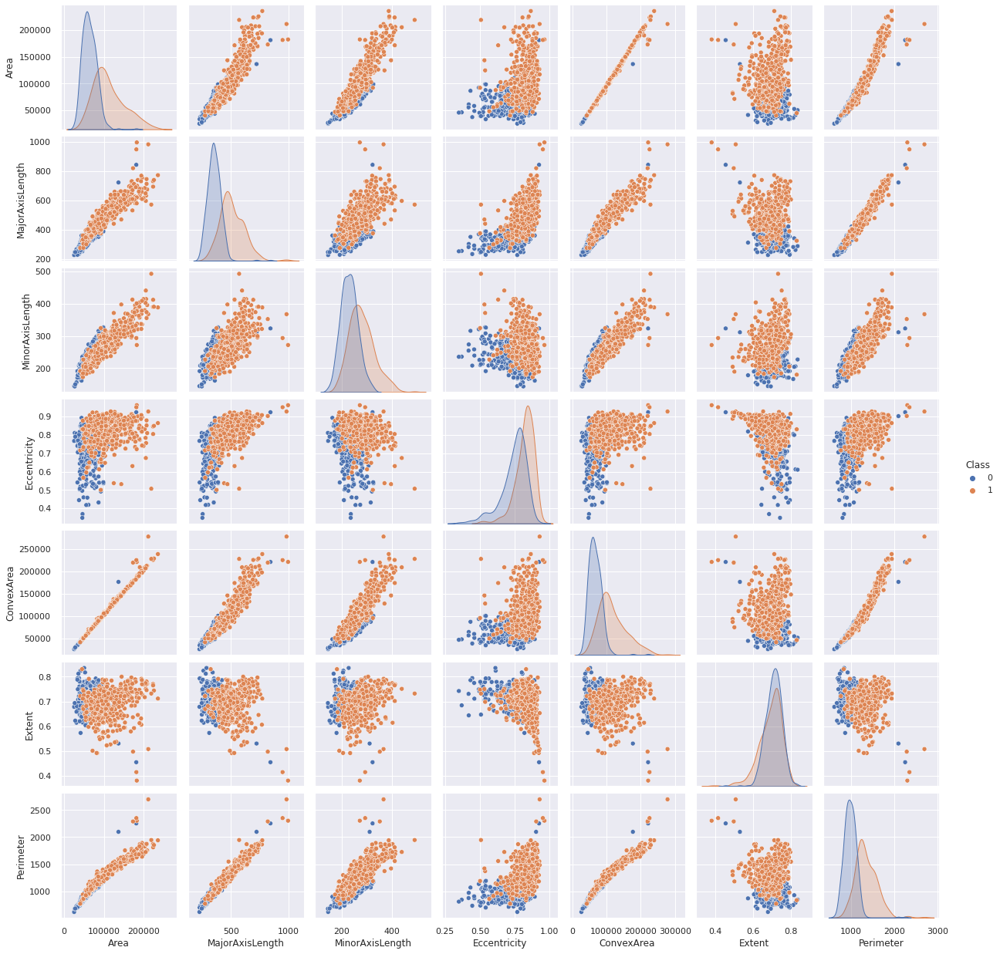

In [ ]:
sns.pairplot(df, hue='Class')
plt.show()

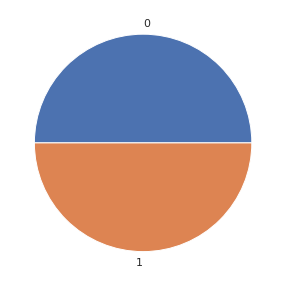

In [ ]:
y =df['Class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [ ]:
X = df.drop(columns=['Class'])
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251
5,49242,318.125407,200.122120,0.777351,51368,0.658456,881.836
6,42492,310.146072,176.131449,0.823099,43904,0.665894,823.796
7,60952,332.455472,235.429835,0.706058,62329,0.743598,933.366
8,42256,323.189607,172.575926,0.845499,44743,0.698031,849.728
9,64380,366.964842,227.771615,0.784056,66125,0.664376,981.544


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,900.0,87804.127778,39002.111390,25387.000000,59348.000000,78902.000000,105028.250000,235047.000000
MajorAxisLength,900.0,430.929950,116.035121,225.629541,345.442898,407.803951,494.187014,997.291941
MinorAxisLength,900.0,254.488133,49.988902,143.710872,219.111126,247.848409,279.888575,492.275279
Eccentricity,900.0,0.781542,0.090318,0.348730,0.741766,0.798846,0.842571,0.962124
ConvexArea,900.0,91186.090000,40769.290132,26139.000000,61513.250000,81651.000000,108375.750000,278217.000000
Extent,900.0,0.699508,0.053468,0.379856,0.670869,0.707367,0.734991,0.835455
Perimeter,900.0,1165.906636,273.764315,619.074000,966.410750,1119.509000,1308.389750,2697.753000


**Standardize the Data**

In [ ]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter
0,-0.007186,0.097577,-0.023958,0.423142,-0.015709,1.106743,0.066274
1,-0.324217,-0.209012,-0.229292,0.224476,-0.304248,-0.287777,-0.161252
2,0.078292,0.097758,0.236988,0.186239,0.062113,-1.158250,0.155945
3,-1.074286,-1.245051,-0.915273,-1.069623,-1.076165,0.001711,-1.175915
4,-0.215393,-0.678958,0.727354,-2.409827,-0.238623,1.745259,-0.338639
5,-0.989269,-0.972699,-1.088166,-0.046427,-0.977212,-0.768202,-1.038224
6,-1.162433,-1.041504,-1.568353,0.460367,-1.160393,-0.629029,-1.250349
7,-0.688862,-0.849133,-0.381463,-0.836226,-0.708208,0.825066,-0.849891
8,-1.168487,-0.929031,-1.639519,0.708518,-1.139802,-0.027639,-1.155572
9,-0.600920,-0.551563,-0.534746,0.027845,-0.615047,-0.657433,-0.673810


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,900.0,1.894781e-16,1.000556,-1.601242,-0.730010,-0.228374,0.441866,3.777353
MajorAxisLength,900.0,0.000000e+00,1.000556,-1.770279,-0.737144,-0.199413,0.545458,4.883667
MinorAxisLength,900.0,-8.210716e-16,1.000556,-2.217269,-0.708091,-0.132898,0.508404,4.759444
Eccentricity,900.0,6.947529e-16,1.000556,-4.794739,-0.440641,0.191694,0.676084,2.000508
ConvexArea,900.0,6.315935e-17,1.000556,-1.596379,-0.728228,-0.234009,0.421867,4.590095
Extent,900.0,1.436875e-15,1.000556,-5.981678,-0.535921,0.147067,0.664006,2.543983
Perimeter,900.0,-6.315935e-17,1.000556,-1.998568,-0.729119,-0.169574,0.520748,5.598604


**Observations and Variables**

In [ ]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

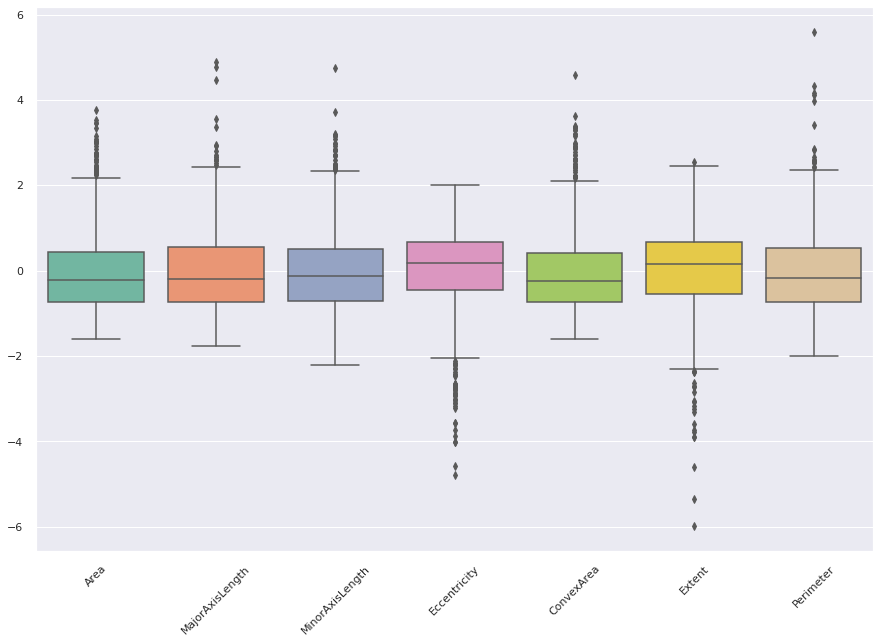

In [ ]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

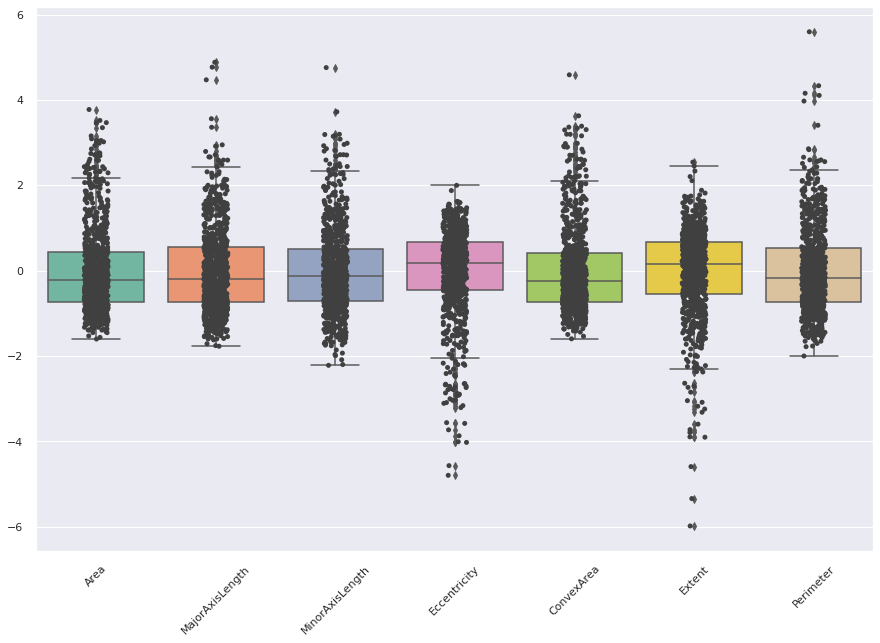

In [ ]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()

ax = plt.figure(figsize=(15,10))    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

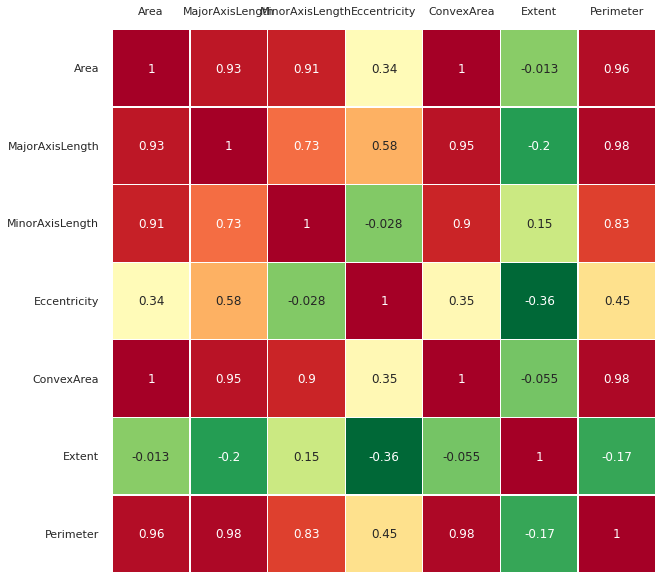

In [ ]:
fig1,ax1 = plt.subplots(figsize=(15,10))
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

#X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
#sns.clustermap(X.corr(), annot=True, fmt='.2f')

# **Principal Component Analysis (PCA)**

Text(0, 0.5, '$Z_2$')

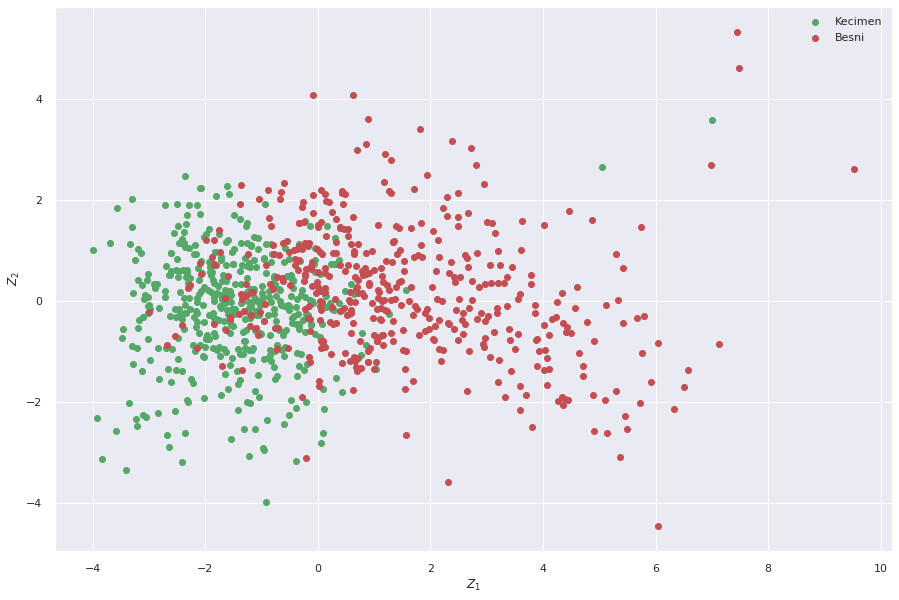

In [ ]:
pca = PCA()
Z = pca.fit_transform(X)

# (Besni)->1,  (Kecimen)->0

idx_Kecimen= np.where(y == 0)
idx_Besni = np.where(y == 1)


plt. figure(figsize=(15,10))
plt.scatter(Z[idx_Kecimen,0], Z[idx_Kecimen,1], c='g', label='Kecimen')
plt.scatter(Z[idx_Besni,0], Z[idx_Besni,1], c='r', label='Besni')


plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

**Eigenvectors**

array([[ 0.44828422, -0.11609991,  0.00548378, -0.11113906, -0.61104765,
        -0.09983439, -0.62436686],
       [ 0.4432398 ,  0.13658724, -0.10054797,  0.49520464,  0.08757032,
        -0.68557712,  0.22772863],
       [ 0.38938118, -0.37492246,  0.23604354, -0.6558767 ,  0.38457775,
        -0.2390332 ,  0.12995283],
       [ 0.20297098,  0.61082321, -0.62852206, -0.42629865,  0.07510412,
         0.05356014,  0.02044403],
       [ 0.45093833, -0.08761633,  0.0366724 ,  0.0558117 , -0.39241075,
         0.47120104,  0.63914127],
       [-0.05636836, -0.66734439, -0.73198093,  0.10905256,  0.05685884,
         0.02345199, -0.00161639],
       [ 0.45082374,  0.03417227,  0.04430077,  0.3398651 ,  0.5551508 ,
         0.48726906, -0.36399975]])

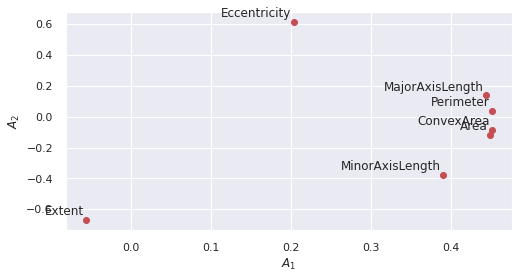

In [ ]:
A = pca.components_.T 
plt. figure(figsize=(8,4))

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')
A

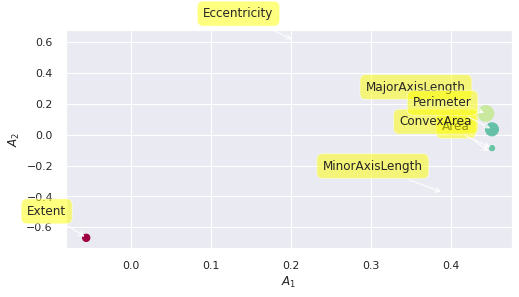

In [ ]:
plt. figure(figsize=(8,4))
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree plot**

array([4.83766379e+00, 1.45480489e+00, 6.29148522e-01, 5.68877209e-02,
       2.18325269e-02, 6.43734371e-03, 1.01163378e-03])

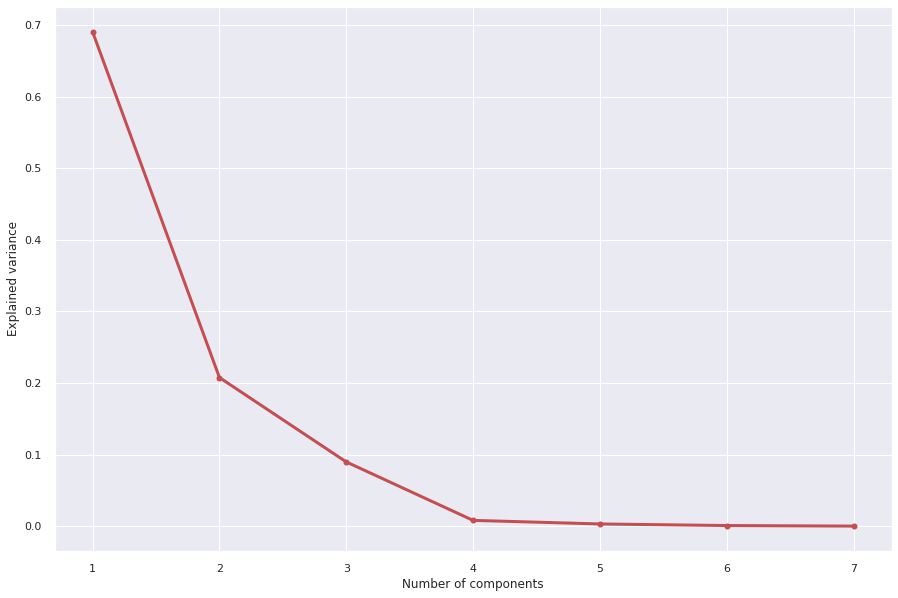

In [ ]:
#Eigenvalues
Lambda = pca.explained_variance_ 

#Scree plot
x = np.arange(len(Lambda)) + 1
plt. figure(figsize=(15,10))
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
Lambda

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

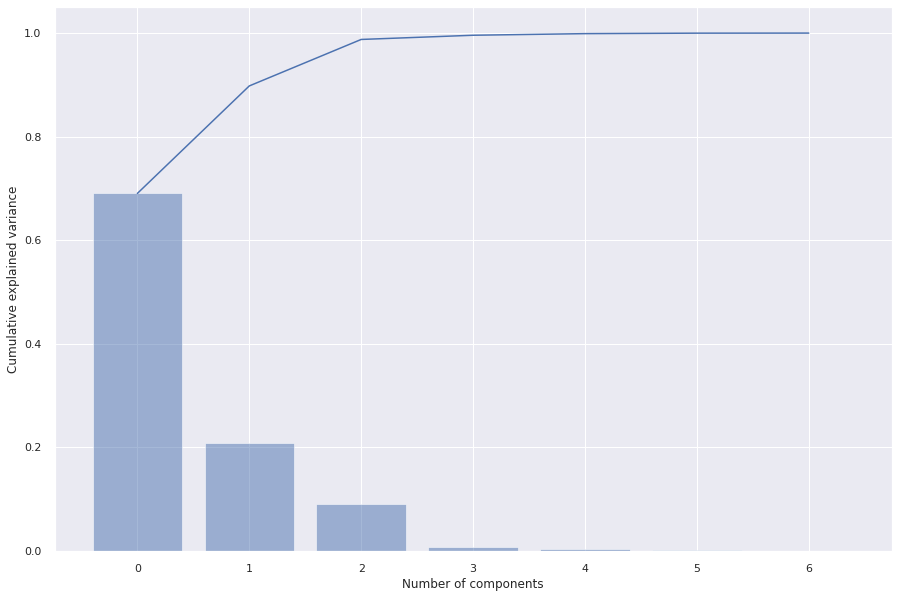

In [ ]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt. figure(figsize=(15,10))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

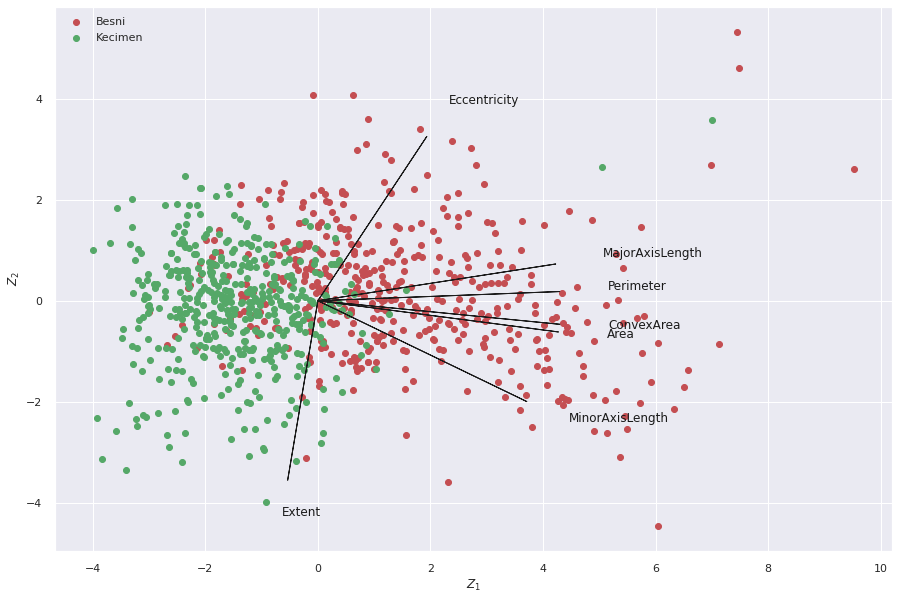

In [ ]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]

plt. figure(figsize=(15,10))
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_Besni,0], Z[idx_Besni,1], c='r', label='Besni')
plt.scatter(Z[idx_Kecimen,0], Z[idx_Kecimen,1], c='g', label='Kecimen')

plt.legend(loc='upper left')

# **Using PCA Library**

In [ ]:
!pip install pca

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [7] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [7] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


**Principal components**

In [ ]:
out['PC']

,PC1,PC2,PC3
0,0.076994,-0.453328,-1.089214
1,-0.475376,0.445368,0.016372
2,0.372109,0.802008,0.786487
3,-2.622445,-0.302564,0.482721
4,-0.962054,-2.967763,0.452154
...,...,...,...
895,-0.114629,0.694645,0.129914
896,0.273577,0.953934,0.696489
897,0.682451,-1.308199,0.091732
898,0.648410,0.979248,0.091413


**Scatter plot**

[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].


(<Figure size 1440x1080 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f3e84b070d0>)

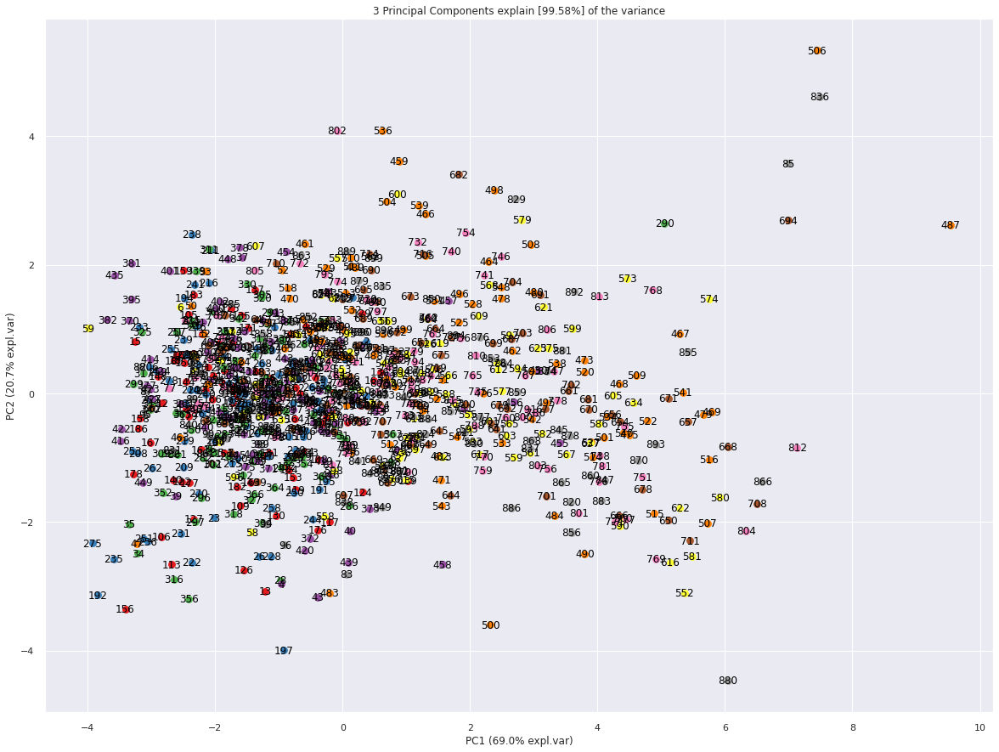

In [ ]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [ ]:
A = out['loadings'].T
A

,PC1,PC2,PC3
Area,0.448284,-0.116100,0.005484
MajorAxisLength,0.443240,0.136587,-0.100548
MinorAxisLength,0.389381,-0.374922,0.236044
Eccentricity,0.202971,0.610823,-0.628522
ConvexArea,0.450938,-0.087616,0.036672
Extent,-0.056368,-0.667344,-0.731981
Perimeter,0.450824,0.034172,0.044301


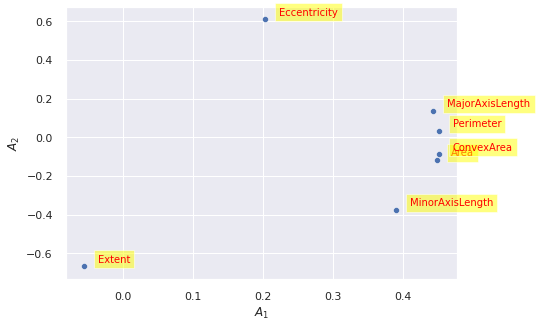

In [ ]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))
 

**Scree Plot**

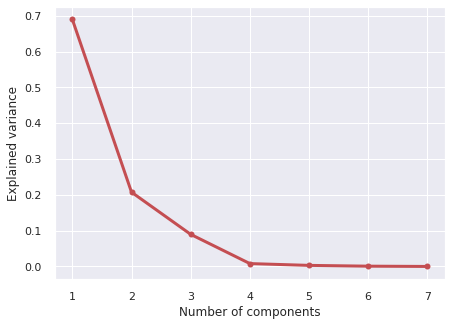

In [ ]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

**Explained Variance Plot**

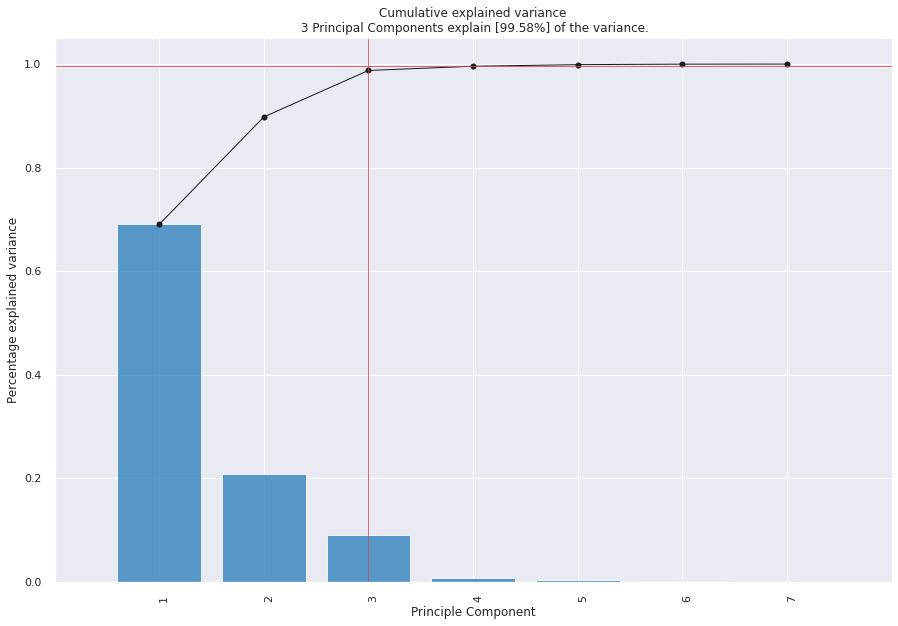

<Figure size 504x360 with 0 Axes>

In [ ]:
model.plot();

**Biplot**

[pca] >Plot PC1 vs PC2 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].


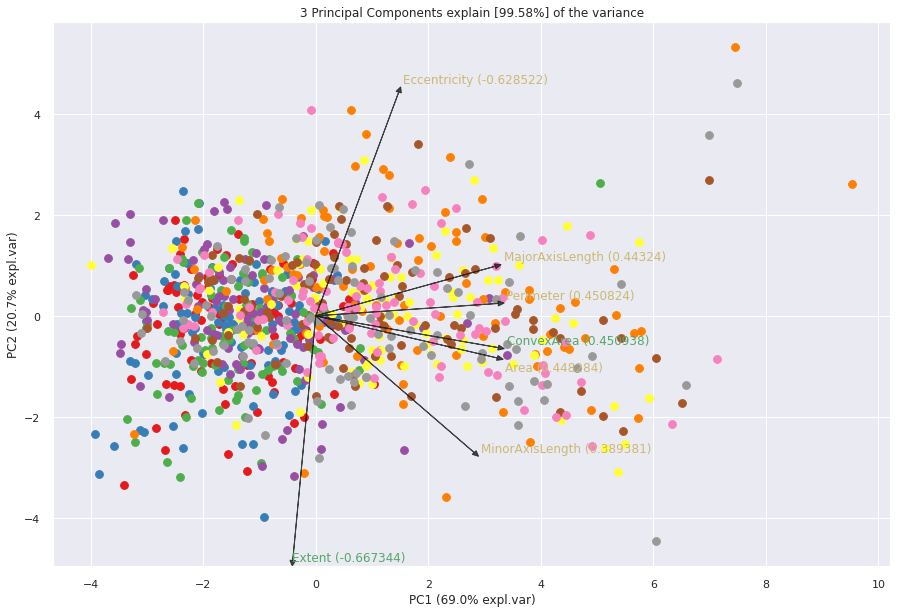

(<Figure size 1080x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f3e83b077c0>)

In [ ]:
model.biplot(label=False, legend=False, color_arrow='k')

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [900] unique colors! Available unique colors: [9].


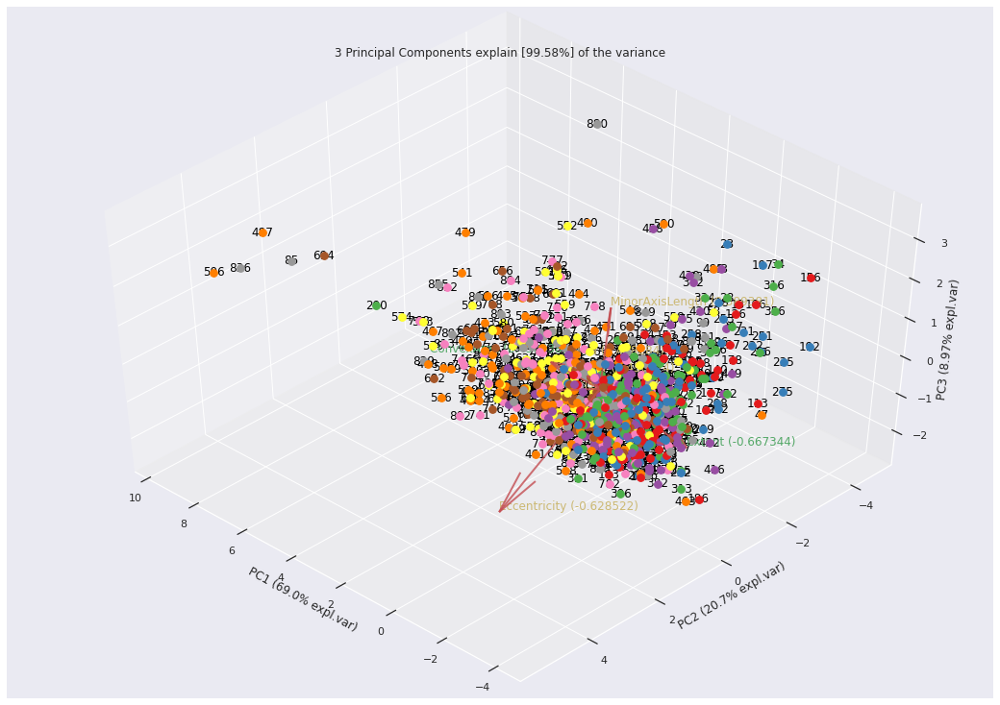

(<Figure size 1080x720 with 2 Axes>,
 <mpl_toolkits.mplot3d.axes3d.Axes3D at 0x7f3e831fbdc0>)

In [ ]:
model.biplot3d(legend=False)

aa change karvu


# Classification using Pycaret
At first dataset is split into train and test set with 70% and 30% ratio respectively. Then using the PyCaret compare_models() function, the models which shows the highest accuracy on the original dataset can be found. 
Before applying PCA, the output from compare_models() function shows that Linear Discriminant Analayis, Extra Trees Classifier, and Gradient Boosting Classifier shows the best performance.

 However, after applying PCA, the these models performance decreases and Logistic Regression, K-nearest neighbour, and Quadratic Discriminant Analysis shows the highest performance. Therefore, I have taken Logistic Regression, K-nearest Neighbour and Quadratic discriminant Analysis as my classification algorithms and applied these three models on the original dataset before applying PCA and after applying PCA.

In [ ]:
#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'2.3.6'

In [ ]:
#For Google Colab only
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In [ ]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)
#dr = df.drop(columns=['id'])

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (810, 8)
Unseen Data For Predictions: (90, 8)


In [120]:
from pycaret.classification import *
clf = setup(data=data, target='Class', train_size=0.7, session_id=123)

,Description,Value
0,session_id,123
1,Target,Class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(810, 8)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='Class',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluste

**Comparing All Models**

In [121]:
#show the best model and their statistics
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8852,0.9384,0.8634,0.9065,0.8829,0.7704,0.7736,0.248
et,Extra Trees Classifier,0.8763,0.9296,0.8387,0.9114,0.8720,0.7528,0.7572,0.148
rf,Random Forest Classifier,0.8693,0.9251,0.8246,0.9096,0.8635,0.7387,0.7439,0.191
gbc,Gradient Boosting Classifier,0.8641,0.9228,0.8248,0.9018,0.8586,0.7282,0.7346,0.106
lda,Linear Discriminant Analysis,0.8623,0.9286,0.8600,0.8695,0.8630,0.7245,0.7274,0.013
ridge,Ridge Classifier,0.8605,0.0000,0.8461,0.8775,0.8591,0.7210,0.7251,0.011
qda,Quadratic Discriminant Analysis,0.8603,0.9246,0.8036,0.9093,0.8519,0.7209,0.7273,0.012
lightgbm,Light Gradient Boosting Machine,0.8568,0.9227,0.8280,0.8819,0.8533,0.7136,0.7160,0.119
ada,Ada Boost Classifier,0.8534,0.9106,0.8283,0.8774,0.8509,0.7069,0.7097,0.086
nb,Naive Bayes,0.8377,0.9099,0.7618,0.9033,0.8254,0.6757,0.6854,0.013


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:compare_models() succesfully completed......................................


In [122]:
best_model

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

Create a Model

**Logistic Regresssion**

In [123]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.8682,0.8621,0.8333,0.8475,0.6839,0.6843
1,0.8947,0.9421,0.8621,0.9259,0.8929,0.7897,0.7916
2,0.8947,0.9631,0.9310,0.8710,0.9000,0.7891,0.7911
3,0.8246,0.9212,0.7241,0.9130,0.8077,0.6503,0.6651
4,0.8947,0.9323,0.8621,0.9259,0.8929,0.7897,0.7916
5,0.9474,0.9717,0.8929,1.0000,0.9434,0.8945,0.8995
6,0.8393,0.9298,0.8214,0.8519,0.8364,0.6786,0.6790
7,0.8750,0.9439,0.8214,0.9200,0.8679,0.7500,0.7543
8,0.9464,0.9783,0.9643,0.9310,0.9474,0.8929,0.8934
9,0.8929,0.9337,0.8929,0.8929,0.8929,0.7857,0.7857


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:create_model() succesfully completed......................................


**Tune the model**

In [124]:
tuned_lr=tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.8682,0.8621,0.8333,0.8475,0.6839,0.6843
1,0.9123,0.9421,0.8621,0.9615,0.9091,0.8248,0.8294
2,0.8947,0.9618,0.9310,0.8710,0.9000,0.7891,0.7911
3,0.8246,0.9212,0.7241,0.9130,0.8077,0.6503,0.6651
4,0.8947,0.9323,0.8621,0.9259,0.8929,0.7897,0.7916
5,0.9474,0.9717,0.8929,1.0000,0.9434,0.8945,0.8995
6,0.8393,0.9298,0.8214,0.8519,0.8364,0.6786,0.6790
7,0.8750,0.9439,0.8214,0.9200,0.8679,0.7500,0.7543
8,0.9464,0.9783,0.9643,0.9310,0.9474,0.8929,0.8934
9,0.8929,0.9349,0.8929,0.8929,0.8929,0.7857,0.7857


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 4
INFO:logs:LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [125]:
tuned_lr

LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Evaluate Logistic Regression**

In [126]:
evaluate_model(tuned_lr)

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


**Create model with K-nearest neighbour**

In [127]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7895,0.8362,0.7586,0.8148,0.7857,0.5793,0.5808
1,0.8070,0.8411,0.7586,0.8462,0.8000,0.6146,0.6181
2,0.8421,0.9033,0.8276,0.8571,0.8421,0.6843,0.6847
3,0.7368,0.8282,0.6897,0.7692,0.7273,0.4745,0.4771
4,0.7193,0.7599,0.6897,0.7407,0.7143,0.4391,0.4402
5,0.9123,0.9452,0.8214,1.0000,0.9020,0.8240,0.8370
6,0.7321,0.8125,0.7143,0.7407,0.7273,0.4643,0.4646
7,0.8750,0.9018,0.8214,0.9200,0.8679,0.7500,0.7543
8,0.8393,0.9043,0.9286,0.7879,0.8525,0.6786,0.6897
9,0.8929,0.9216,0.8571,0.9231,0.8889,0.7857,0.7877


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 5
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:create_model() succesfully completed......................................


**Tune model with K-nearest neighbour**

In [128]:
tuned_knn = tune_model(knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7895,0.8091,0.7241,0.8400,0.7778,0.5799,0.5856
1,0.8421,0.8695,0.7586,0.9167,0.8302,0.6851,0.6958
2,0.8070,0.9119,0.7241,0.8750,0.7925,0.6151,0.6247
3,0.7719,0.8331,0.6552,0.8636,0.7451,0.5457,0.5628
4,0.6842,0.7716,0.6897,0.6897,0.6897,0.3682,0.3682
5,0.8947,0.9255,0.7857,1.0000,0.8800,0.7886,0.8069
6,0.7857,0.8418,0.7143,0.8333,0.7692,0.5714,0.5774
7,0.8929,0.9126,0.7857,1.0000,0.8800,0.7857,0.8044
8,0.8750,0.9286,0.8571,0.8889,0.8727,0.7500,0.7505
9,0.8214,0.9094,0.7143,0.9091,0.8000,0.6429,0.6581


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 6
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=8, p=2,
                     weights='uniform')
INFO:logs:tune_model() succesfully completed......................................


In [129]:
tuned_knn

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=8, p=2,
                     weights='uniform')

**Evaluate model with K-nearest neighbour**

In [130]:
evaluate_model(tuned_knn)

,Parameters
algorithm,auto
leaf_size,30
metric,manhattan
metric_params,None
n_jobs,-1
n_neighbors,8
p,2
weights,uniform


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


**Create model with Ridge classifier Model**

In [136]:
ridge=create_model('ridge')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8246,0.0,0.7931,0.8519,0.8214,0.6494,0.6510
1,0.8772,0.0,0.8621,0.8929,0.8772,0.7545,0.7549
2,0.8421,0.0,0.8966,0.8125,0.8525,0.6835,0.6874
3,0.8246,0.0,0.7241,0.9130,0.8077,0.6503,0.6651
4,0.8421,0.0,0.8276,0.8571,0.8421,0.6843,0.6847
5,0.9123,0.0,0.8214,1.0000,0.9020,0.8240,0.8370
6,0.8571,0.0,0.8929,0.8333,0.8621,0.7143,0.7161
7,0.8571,0.0,0.8214,0.8846,0.8519,0.7143,0.7161
8,0.9107,0.0,0.9286,0.8966,0.9123,0.8214,0.8220
9,0.8571,0.0,0.8929,0.8333,0.8621,0.7143,0.7161


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 9
INFO:logs:RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, normalize=False, random_state=123, solver='auto',
                tol=0.001)
INFO:logs:create_model() succesfully completed......................................


**Tune ridge Model**

In [137]:
tuned_ridge=tune_model(ridge)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8070,0.0,0.6897,0.9091,0.7843,0.6156,0.6349
1,0.8947,0.0,0.7931,1.0000,0.8846,0.7902,0.8082
2,0.8246,0.0,0.7931,0.8519,0.8214,0.6494,0.6510
3,0.7895,0.0,0.6552,0.9048,0.7600,0.5809,0.6050
4,0.8772,0.0,0.8276,0.9231,0.8727,0.7548,0.7590
5,0.8947,0.0,0.7857,1.0000,0.8800,0.7886,0.8069
6,0.8750,0.0,0.7500,1.0000,0.8571,0.7500,0.7746
7,0.8750,0.0,0.7857,0.9565,0.8627,0.7500,0.7623
8,0.9464,0.0,0.8929,1.0000,0.9434,0.8929,0.8980
9,0.8393,0.0,0.7500,0.9130,0.8235,0.6786,0.6897


INFO:logs:create_model_container: 22
INFO:logs:master_model_container: 22
INFO:logs:display_container: 10
INFO:logs:RidgeClassifier(alpha=5.39, class_weight=None, copy_X=True, fit_intercept=False,
                max_iter=None, normalize=True, random_state=123, solver='auto',
                tol=0.001)
INFO:logs:tune_model() succesfully completed......................................


**Evaluate ridge Model**

In [138]:
tuned_ridge

RidgeClassifier(alpha=5.39, class_weight=None, copy_X=True, fit_intercept=False,
                max_iter=None, normalize=True, random_state=123, solver='auto',
                tol=0.001)

In [139]:
evaluate_model(tuned_ridge)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=RidgeClassifier(alpha=5.39, class_weight=None, copy_X=True, fit_intercept=False,
                max_iter=None, normalize=True, random_state=123, solver='auto',
                tol=0.001), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [140]:
!pip install statsmodels --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# **Classification + PCA**

In [141]:
clf_pca = setup(data=data, target='Class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,session_id,123
1,Target,Class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(810, 8)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='Class',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('dummy', Dummify(target='Class')),
                ('fix_perfect', Remove_100(target='Class')),
                ('clean_names', Clean_Colum_Names()),
       

# **Comparing Models**

In [142]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
knn,K Neighbors Classifier,0.8604,0.9060,0.8108,0.9032,0.8541,0.7211,0.7255,0.036
lr,Logistic Regression,0.8570,0.9206,0.8424,0.8748,0.8561,0.7139,0.7179,0.017
ridge,Ridge Classifier,0.8569,0.0000,0.7969,0.9102,0.8486,0.7142,0.7212,0.014
lda,Linear Discriminant Analysis,0.8569,0.9213,0.7969,0.9102,0.8486,0.7142,0.7212,0.010
lightgbm,Light Gradient Boosting Machine,0.8553,0.9056,0.8283,0.8792,0.8517,0.7107,0.7137,0.114
nb,Naive Bayes,0.8552,0.9199,0.7933,0.9089,0.8467,0.7107,0.7171,0.020
ada,Ada Boost Classifier,0.8517,0.9077,0.8145,0.8839,0.8465,0.7036,0.7076,0.082
qda,Quadratic Discriminant Analysis,0.8463,0.9112,0.7865,0.8994,0.8370,0.6930,0.7011,0.010
rf,Random Forest Classifier,0.8429,0.9069,0.8004,0.8800,0.8366,0.6859,0.6909,0.311
gbc,Gradient Boosting Classifier,0.8412,0.9094,0.8144,0.8657,0.8376,0.6824,0.6858,0.081


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:compare_models() succesfully completed......................................


# **Best model with PCA**

In [143]:
best_model_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

# **Tune Best Model**

In [144]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.9002,0.7586,0.9167,0.8302,0.6851,0.6958
1,0.8772,0.8904,0.8621,0.8929,0.8772,0.7545,0.7549
2,0.8772,0.9655,0.8621,0.8929,0.8772,0.7545,0.7549
3,0.8070,0.9317,0.6897,0.9091,0.7843,0.6156,0.6349
4,0.8596,0.8849,0.8276,0.8889,0.8571,0.7196,0.7213
5,0.9298,0.9446,0.8571,1.0000,0.9231,0.8593,0.8679
6,0.8393,0.9082,0.7857,0.8800,0.8302,0.6786,0.6825
7,0.8929,0.9267,0.8571,0.9231,0.8889,0.7857,0.7877
8,0.9286,0.9528,0.8929,0.9615,0.9259,0.8571,0.8593
9,0.8571,0.9184,0.8214,0.8846,0.8519,0.7143,0.7161


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance')
INFO:logs:tune_model() succesfully completed......................................


# **Evaluate Best Model**

In [145]:
evaluate_model(tuned_best_model_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Create K-nearest neighbour Model**

In [146]:
knn_pca = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8070,0.8959,0.7586,0.8462,0.8000,0.6146,0.6181
1,0.8947,0.8947,0.8621,0.9259,0.8929,0.7897,0.7916
2,0.8947,0.9501,0.8621,0.9259,0.8929,0.7897,0.7916
3,0.8421,0.8990,0.7586,0.9167,0.8302,0.6851,0.6958
4,0.7895,0.8713,0.7241,0.8400,0.7778,0.5799,0.5856
5,0.9298,0.9163,0.8571,1.0000,0.9231,0.8593,0.8679
6,0.8571,0.8858,0.7857,0.9167,0.8462,0.7143,0.7217
7,0.8571,0.8852,0.8214,0.8846,0.8519,0.7143,0.7161
8,0.9286,0.9630,0.8929,0.9615,0.9259,0.8571,0.8593
9,0.8036,0.8986,0.7857,0.8148,0.8000,0.6071,0.6075


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 4
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:create_model() succesfully completed......................................


# **Tune Model**

In [147]:
tuned_knn_pca = tune_model(knn_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.9002,0.7586,0.9167,0.8302,0.6851,0.6958
1,0.8772,0.8904,0.8621,0.8929,0.8772,0.7545,0.7549
2,0.8772,0.9655,0.8621,0.8929,0.8772,0.7545,0.7549
3,0.8070,0.9317,0.6897,0.9091,0.7843,0.6156,0.6349
4,0.8596,0.8849,0.8276,0.8889,0.8571,0.7196,0.7213
5,0.9298,0.9446,0.8571,1.0000,0.9231,0.8593,0.8679
6,0.8393,0.9082,0.7857,0.8800,0.8302,0.6786,0.6825
7,0.8929,0.9267,0.8571,0.9231,0.8889,0.7857,0.7877
8,0.9286,0.9528,0.8929,0.9615,0.9259,0.8571,0.8593
9,0.8571,0.9184,0.8214,0.8846,0.8519,0.7143,0.7161


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 5
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance')
INFO:logs:tune_model() succesfully completed......................................


In [148]:
tuned_knn_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance')

# **Evaluate Model KNN**

In [ ]:
evaluate_model(tuned_knn_pca)

,Parameters
algorithm,auto
leaf_size,30
metric,manhattan
metric_params,None
n_jobs,-1
n_neighbors,13
p,2
weights,distance


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


# **Create Logistic Regression Model**

In [149]:
lr_pca = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7544,0.8547,0.7586,0.7586,0.7586,0.5086,0.5086
1,0.8947,0.9224,0.8621,0.9259,0.8929,0.7897,0.7916
2,0.8596,0.9446,0.9310,0.8182,0.8710,0.7185,0.7257
3,0.8421,0.9015,0.7586,0.9167,0.8302,0.6851,0.6958
4,0.8246,0.8916,0.8276,0.8276,0.8276,0.6490,0.6490
5,0.9123,0.9803,0.8214,1.0000,0.9020,0.8240,0.8370
6,0.8750,0.9324,0.8929,0.8621,0.8772,0.7500,0.7505
7,0.8393,0.9235,0.7857,0.8800,0.8302,0.6786,0.6825
8,0.9107,0.9592,0.8929,0.9259,0.9091,0.8214,0.8220
9,0.8571,0.8954,0.8929,0.8333,0.8621,0.7143,0.7161


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 6
INFO:logs:LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:create_model() succesfully completed......................................


# **Tune Model**

In [150]:
tuned_lr_pca = tune_model(lr_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7895,0.8559,0.7586,0.8148,0.7857,0.5793,0.5808
1,0.8947,0.9212,0.8621,0.9259,0.8929,0.7897,0.7916
2,0.8772,0.9483,0.9310,0.8438,0.8852,0.7539,0.7581
3,0.8421,0.8990,0.7586,0.9167,0.8302,0.6851,0.6958
4,0.8246,0.8929,0.8276,0.8276,0.8276,0.6490,0.6490
5,0.9123,0.9815,0.8214,1.0000,0.9020,0.8240,0.8370
6,0.8750,0.9324,0.8929,0.8621,0.8772,0.7500,0.7505
7,0.8393,0.9222,0.7857,0.8800,0.8302,0.6786,0.6825
8,0.9286,0.9605,0.8929,0.9615,0.9259,0.8571,0.8593
9,0.8571,0.8954,0.8929,0.8333,0.8621,0.7143,0.7161


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 7
INFO:logs:LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


# **Evaluate Model**

In [151]:
tuned_lr_pca

LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
evaluate_model(tuned_lr_pca)

INFO:logs:plot_model() succesfully completed......................................


# **Create Ridge Model**

In [152]:
ridge_pca = create_model('ridge')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8246,0.0,0.7241,0.9130,0.8077,0.6503,0.6651
1,0.8772,0.0,0.8276,0.9231,0.8727,0.7548,0.7590
2,0.8246,0.0,0.7931,0.8519,0.8214,0.6494,0.6510
3,0.8070,0.0,0.6897,0.9091,0.7843,0.6156,0.6349
4,0.8772,0.0,0.8276,0.9231,0.8727,0.7548,0.7590
5,0.9123,0.0,0.8214,1.0000,0.9020,0.8240,0.8370
6,0.8393,0.0,0.7857,0.8800,0.8302,0.6786,0.6825
7,0.8393,0.0,0.7857,0.8800,0.8302,0.6786,0.6825
8,0.9464,0.0,0.8929,1.0000,0.9434,0.8929,0.8980
9,0.8214,0.0,0.8214,0.8214,0.8214,0.6429,0.6429


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 8
INFO:logs:RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, normalize=False, random_state=123, solver='auto',
                tol=0.001)
INFO:logs:create_model() succesfully completed......................................


# **Tune Model**

In [153]:
tuned_ridge_pca = tune_model(ridge_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8246,0.0,0.7241,0.9130,0.8077,0.6503,0.6651
1,0.8772,0.0,0.8276,0.9231,0.8727,0.7548,0.7590
2,0.8246,0.0,0.7931,0.8519,0.8214,0.6494,0.6510
3,0.8070,0.0,0.6897,0.9091,0.7843,0.6156,0.6349
4,0.8772,0.0,0.8276,0.9231,0.8727,0.7548,0.7590
5,0.9123,0.0,0.8214,1.0000,0.9020,0.8240,0.8370
6,0.8393,0.0,0.7857,0.8800,0.8302,0.6786,0.6825
7,0.8393,0.0,0.7857,0.8800,0.8302,0.6786,0.6825
8,0.9464,0.0,0.8929,1.0000,0.9434,0.8929,0.8980
9,0.8393,0.0,0.8214,0.8519,0.8364,0.6786,0.6790


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 9
INFO:logs:RidgeClassifier(alpha=2.81, class_weight=None, copy_X=True, fit_intercept=False,
                max_iter=None, normalize=True, random_state=123, solver='auto',
                tol=0.001)
INFO:logs:tune_model() succesfully completed......................................


# **Evaluate Model**

In [154]:
tuned_ridge_pca

RidgeClassifier(alpha=2.81, class_weight=None, copy_X=True, fit_intercept=False,
                max_iter=None, normalize=True, random_state=123, solver='auto',
                tol=0.001)

In [155]:
evaluate_model(tuned_ridge_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=RidgeClassifier(alpha=2.81, class_weight=None, copy_X=True, fit_intercept=False,
                max_iter=None, normalize=True, random_state=123, solver='auto',
                tol=0.001), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# Explainable AI with Shapley values
For binary classification, AI shapley can only support tree based classification models. As none of the the best three models with highest accuracy (LR, KNN, QDA) based on tree, I chose the fourth best model "Extra trees classifier" for the AI Shapley analysis.

In [156]:
et_pca = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7895,0.8996,0.7241,0.8400,0.7778,0.5799,0.5856
1,0.8596,0.8879,0.8276,0.8889,0.8571,0.7196,0.7213
2,0.8947,0.9464,0.9310,0.8710,0.9000,0.7891,0.7911
3,0.8070,0.9335,0.6897,0.9091,0.7843,0.6156,0.6349
4,0.8246,0.8910,0.7931,0.8519,0.8214,0.6494,0.6510
5,0.8246,0.9089,0.7143,0.9091,0.8000,0.6477,0.6627
6,0.8214,0.9273,0.7857,0.8462,0.8148,0.6429,0.6445
7,0.8393,0.9216,0.8571,0.8276,0.8421,0.6786,0.6790
8,0.8929,0.9598,0.8929,0.8929,0.8929,0.7857,0.7857
9,0.8036,0.8948,0.7857,0.8148,0.8000,0.6071,0.6075


INFO:logs:create_model_container: 22
INFO:logs:master_model_container: 22
INFO:logs:display_container: 10
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [157]:
tuned_et_pca = tune_model(et_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.8596,0.7931,0.8846,0.8364,0.6847,0.6885
1,0.8772,0.9261,0.8621,0.8929,0.8772,0.7545,0.7549
2,0.8421,0.9360,0.8621,0.8333,0.8475,0.6839,0.6843
3,0.8421,0.9015,0.7586,0.9167,0.8302,0.6851,0.6958
4,0.8772,0.8855,0.8276,0.9231,0.8727,0.7548,0.7590
5,0.9123,0.9680,0.8214,1.0000,0.9020,0.8240,0.8370
6,0.8571,0.9324,0.8214,0.8846,0.8519,0.7143,0.7161
7,0.8571,0.9235,0.8214,0.8846,0.8519,0.7143,0.7161
8,0.9464,0.9605,0.8929,1.0000,0.9434,0.8929,0.8980
9,0.8571,0.9069,0.8929,0.8333,0.8621,0.7143,0.7161


INFO:logs:create_model_container: 23
INFO:logs:master_model_container: 23
INFO:logs:display_container: 11
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.0005,
                     min_impurity_split=None, min_samples_leaf=3,
                     min_samples_split=5, min_weight_fraction_leaf=0.0,
                     n_estimators=260, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [158]:
tuned_et_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.0005,
                     min_impurity_split=None, min_samples_leaf=3,
                     min_samples_split=5, min_weight_fraction_leaf=0.0,
                     n_estimators=260, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)

In [159]:
evaluate_model(tuned_et_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.0005,
                     min_impurity_split=None, min_samples_leaf=3,
                     min_samples_split=5, min_weight_fraction_leaf=0.0,
                     n_estimators=260, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [160]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [161]:
import shap

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.0005,
                     min_impurity_split=None, min_samples_leaf=3,
                     min_samples_split=5, min_weight_fraction_leaf=0.0,
                     n_estimators=260, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


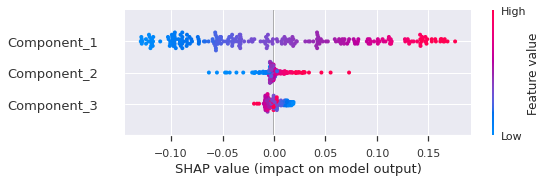

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [162]:
interpret_model(tuned_et_pca, plot='summary')

In [163]:
interpret_model(tuned_et_pca, plot='reason', observation=32)

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.0005,
                     min_impurity_split=None, min_samples_leaf=3,
                     min_samples_split=5, min_weight_fraction_leaf=0.0,
                     n_estimators=260, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=32, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values
INFO:logs:model type detected: Unknown


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [164]:
interpret_model(tuned_et_pca, plot='reason')

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.0005,
                     min_impurity_split=None, min_samples_leaf=3,
                     min_samples_split=5, min_weight_fraction_leaf=0.0,
                     n_estimators=260, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................
